In [4]:
#Step 1 : Import packages

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn import linear_model

In [5]:
#Step 2 : Read the data set

fifa_data = pd.read_csv('Fifa 23 Players Data.csv',sep=',')
fifa_data.head(2)

,Known As,Full Name,Overall,Potential,Value(in Euro),Positions Played,Best Position,Nationality,Image Link,Age,...,LM Rating,CM Rating,RM Rating,LWB Rating,CDM Rating,RWB Rating,LB Rating,CB Rating,RB Rating,GK Rating
0,L. Messi,Lionel Messi,91,91,54000000,RW,CAM,Argentina,https://cdn.sofifa.net/players/158/023/23_60.png,35,...,91,88,91,67,66,67,62,53,62,22
1,K. Benzema,Karim Benzema,91,91,64000000,"CF,ST",CF,France,https://cdn.sofifa.net/players/165/153/23_60.png,34,...,89,84,89,67,67,67,63,58,63,21


# DATA EXPLORATION - General glimpse

In [104]:
fifa_data.shape

(18539, 89)

In [105]:
fifa_data.columns

Index(['Known As', 'Full Name', 'Overall', 'Potential', 'Value(in Euro)',
       'Positions Played', 'Best Position', 'Nationality', 'Image Link', 'Age',
       'Height(in cm)', 'Weight(in kg)', 'TotalStats', 'BaseStats',
       'Club Name', 'Wage(in Euro)', 'Release Clause', 'Club Position',
       'Contract Until', 'Club Jersey Number', 'Joined On', 'On Loan',
       'Preferred Foot', 'Weak Foot Rating', 'Skill Moves',
       'International Reputation', 'National Team Name',
       'National Team Image Link', 'National Team Position',
       'National Team Jersey Number', 'Attacking Work Rate',
       'Defensive Work Rate', 'Pace Total', 'Shooting Total', 'Passing Total',
       'Dribbling Total', 'Defending Total', 'Physicality Total', 'Crossing',
       'Finishing', 'Heading Accuracy', 'Short Passing', 'Volleys',
       'Dribbling', 'Curve', 'Freekick Accuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance',
       'Shot Powe

In [106]:
#Check the NaN values for each column and make a ratio of NaN

# Set the maximum number of rows to display
pd.set_option('display.max_rows', None)

nan_counts = fifa_data.isna().sum()
total_counts = fifa_data.count()

nan_total_ratio = nan_counts / (nan_counts + total_counts)

result_df = pd.DataFrame({
    'NaN Count': nan_counts,
    'Total Count': total_counts,
    'NaN/Total Ratio': nan_total_ratio
})

result_df.head(2)

,NaN Count,Total Count,NaN/Total Ratio
Known As,0,18539,0.0
Full Name,0,18539,0.0


In [107]:
pd.set_option('display.max_columns', None) #set the option to see all the columns

fifa_data.describe()

#We see outliers in the wage column (max value way higher than the 75% of the data set)

,Overall,Potential,Value(in Euro),Age,Height(in cm),Weight(in kg),TotalStats,BaseStats,Wage(in Euro),Release Clause,Joined On,Weak Foot Rating,Skill Moves,International Reputation,Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Dribbling,Curve,Freekick Accuracy,LongPassing,BallControl,Acceleration,Sprint Speed,Agility,Reactions,Balance,Shot Power,Jumping,Stamina,Strength,Long Shots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle,Goalkeeper Diving,Goalkeeper Handling,GoalkeeperKicking,Goalkeeper Positioning,Goalkeeper Reflexes,ST Rating,LW Rating,LF Rating,CF Rating,RF Rating,RW Rating,CAM Rating,LM Rating,CM Rating,RM Rating,LWB Rating,CDM Rating,RWB Rating,LB Rating,CB Rating,RB Rating,GK Rating
count,18539.000000,18539.000000,1.853900e+04,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,1.853900e+04,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000
mean,65.852042,71.016668,2.875461e+06,25.240412,181.550839,75.173904,1602.114569,357.946221,8824.537462,5.081688e+06,2020.367442,2.946437,2.366147,1.086305,68.017746,53.777874,58.024327,63.109553,50.241383,64.775338,49.476833,46.255300,51.846755,59.072226,42.513944,55.898754,47.695129,43.006689,53.568423,58.516263,64.725336,64.838341,63.518906,61.542586,64.059550,57.827661,64.795566,63.040455,65.152004,46.825719,55.668537,46.853282,50.520362,54.191542,47.994444,58.036625,46.747505,48.399159,46.264146,16.402125,16.157182,16.061007,16.205944,16.472895,56.725929,55.819138,55.714925,55.714925,55.714925,55.819138,57.950267,58.451319,57.374076,58.451319,56.281569,55.928583,56.281569,55.650251,54.528184,55.650251,23.257134
std,6.788353,6.192866,7.635129e+06,4.718163,6.858097,7.013593,273.160237,39.628259,19460.531154,1.467203e+07,2.056372,0.673778,0.772428,0.358753,10.649511,13.619867,9.717950,9.336566,16.392532,9.577715,17.887405,19.623881,17.318947,14.287698,17.635249,18.751691,17.910205,16.997758,14.633838,16.590051,15.280849,15.108259,14.905330,8.900297,14.483193,12.949870,12.293523,16.269330,12.622774,19.362064,16.905505,20.666647,19.660034,13.478006,15.730026,12.036272,20.350228,21.191644,20.701146,17.589457,16.924266,16.680839,17.089109,17.927602,13.475267,14.632018,14.216500,14.216500,14.216500,14.632018,13.905442,13.987122,13.171194,13.987122,13.903836,13.872190,13.903836,14.159466,14.743929,14.159466,15.108925
min,47.000000,48.000000,0.000000e+00,16.000000,155.000000,49.000000,759.000000,224.000000,0.000000,0.000000e+00,2002.000000,1.000000,1.000000,1.000000,28.000000,16.000000,25.000000,28.000000,15.000000,30.000000,6.000000,3.000000,5.000000,10.000000,3.000000,3.000000,6.000000,4.000000,9.000000,5.000000,14.000000,15.000000,18.000000,30.000000,20.000000,18.000000,22.000000,14.000000,25.000000,4.000000,10.000000,3.000000,2.000000,10.000000,6.000000,13.000000,3.000000,6.000000,6.000000,2.000000,2.000000,2.000000,2.000000,2.000000,19.000000,14.000000,15.000000,15.000000,15.000000,14.000000,17.000000,18.000000,18.000000,18.000000,17.000000,19.000000,17.000000,17.000000,18.000000,17.000000,10.000000
25%,62.000000,67.000000,4.750000e+05,21.000000,177.000000,70.000000,1470.

# DATA CLEANING

Very clean step. If set not clean, remember to perform following steps :
- check Nan Values and see if you can drop the column, or fill in the NaN (0 or mean in general)
- rename columns and standardize column format
- standardize column value (example : if you have the € sign...)

# EDA

Let's check at categorical data

In [6]:
# Get the count of players for each nationality
import plotly.express as px

nationality_counts = fifa_data["Nationality"].value_counts().reset_index()
nationality_counts.columns = ['Nationality', 'PlayerCount']

# Create a choropleth map using player count as the indicator
fig = px.choropleth(nationality_counts, 
                    locations='Nationality', 
                    locationmode='country names', 
                    color='PlayerCount', 
                    hover_name='Nationality',
                    title='Nationalities Distribution Map'
                   )

fig.update_geos(showcoastlines=True, coastlinecolor="Black")

# Show the map
fig.show()

Let's check at numerical data 

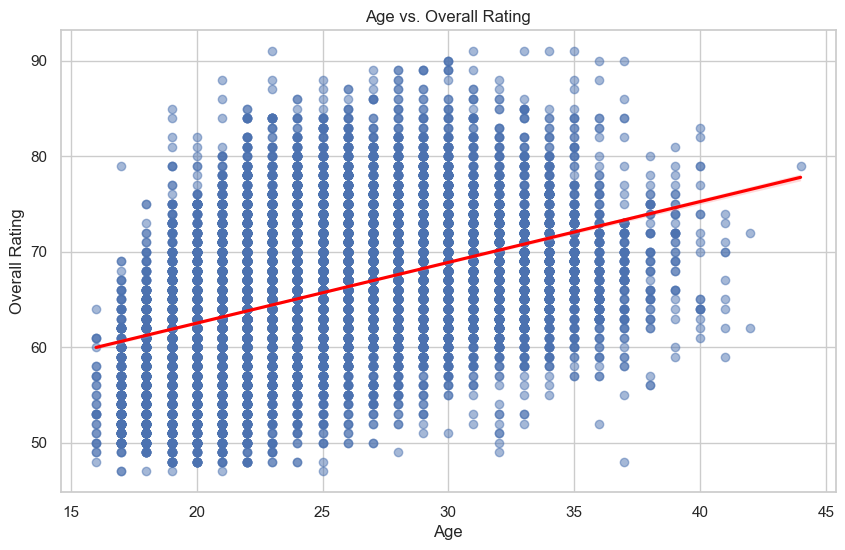

In [56]:
# Create a regression plot
#Goal : visualize the relationship between age and overall rating and determine if there is a trend.

plt.figure(figsize=(10, 6))
sns.regplot(data=fifa_data, x='Age', y='Overall', scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Age vs. Overall Rating')
plt.xlabel('Age')
plt.ylabel('Overall Rating')
plt.show()

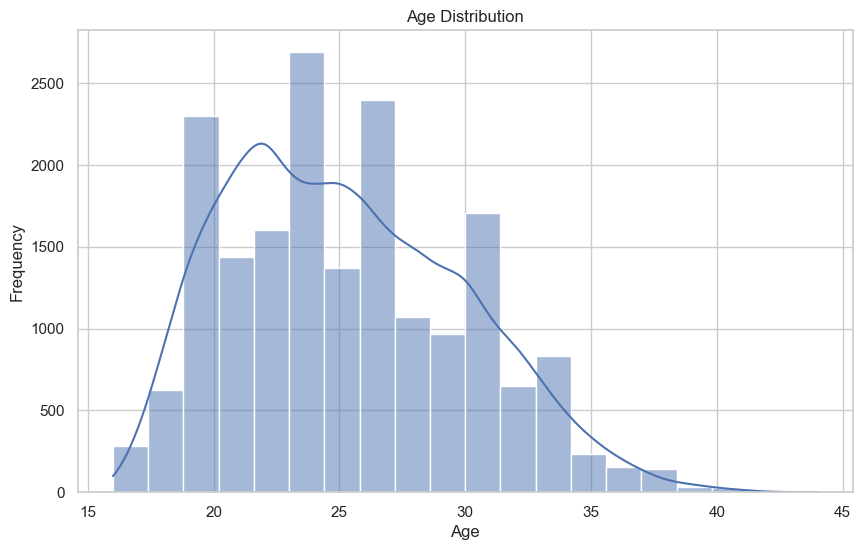

In [57]:
# Create a histogram for the distribution of Age
plt.figure(figsize=(10, 6))
sns.histplot(fifa_data['Age'], bins=20, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

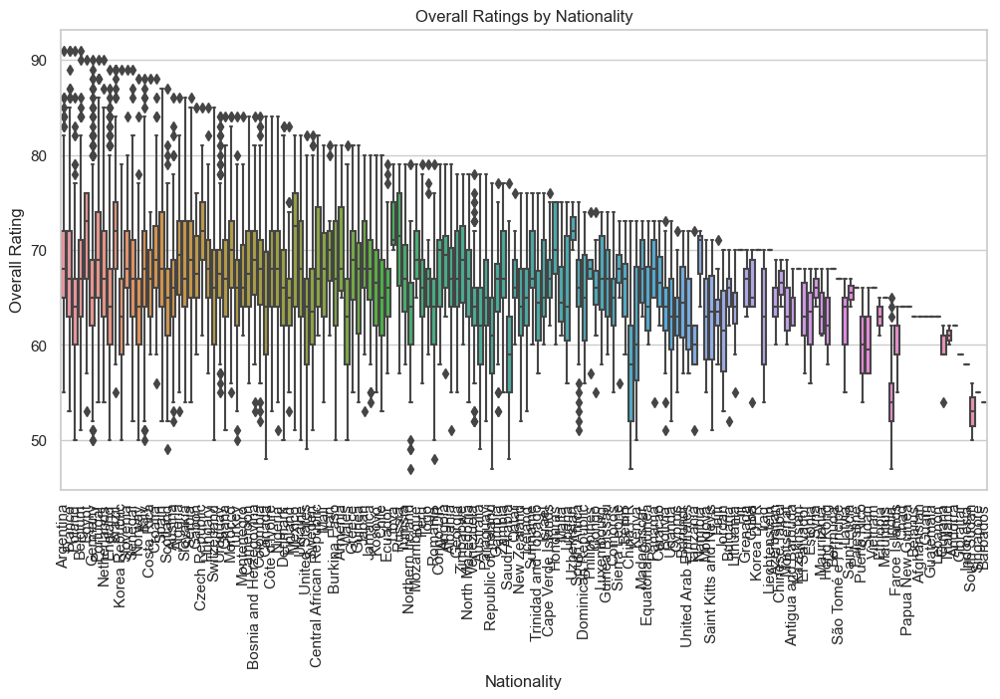

In [58]:
# Create a box plot for Overall ratings by Nationality
plt.figure(figsize=(12, 6))
sns.boxplot(data=fifa_data, x='Nationality', y='Overall')
plt.title('Overall Ratings by Nationality')
plt.xticks(rotation=90)
plt.xlabel('Nationality')
plt.ylabel('Overall Rating')
plt.show()


#Box: The box in the middle represents the interquartile range (IQR), with the upper and lower boundaries 
#of the box corresponding to the first quartile (25th percentile) and the third quartile (75th percentile), 
#respectively. The width of the box is proportional to the IQR.

#Line Inside the Box: This line represents the median value of the dataset.

#Whiskers: The lines (whiskers) extending from the box show the range of the data. 
#Values within the whiskers are typically not considered outliers.

#Outliers: Individual data points located beyond the whiskers are considered potential outliers. 
#They are represented as points or dots.

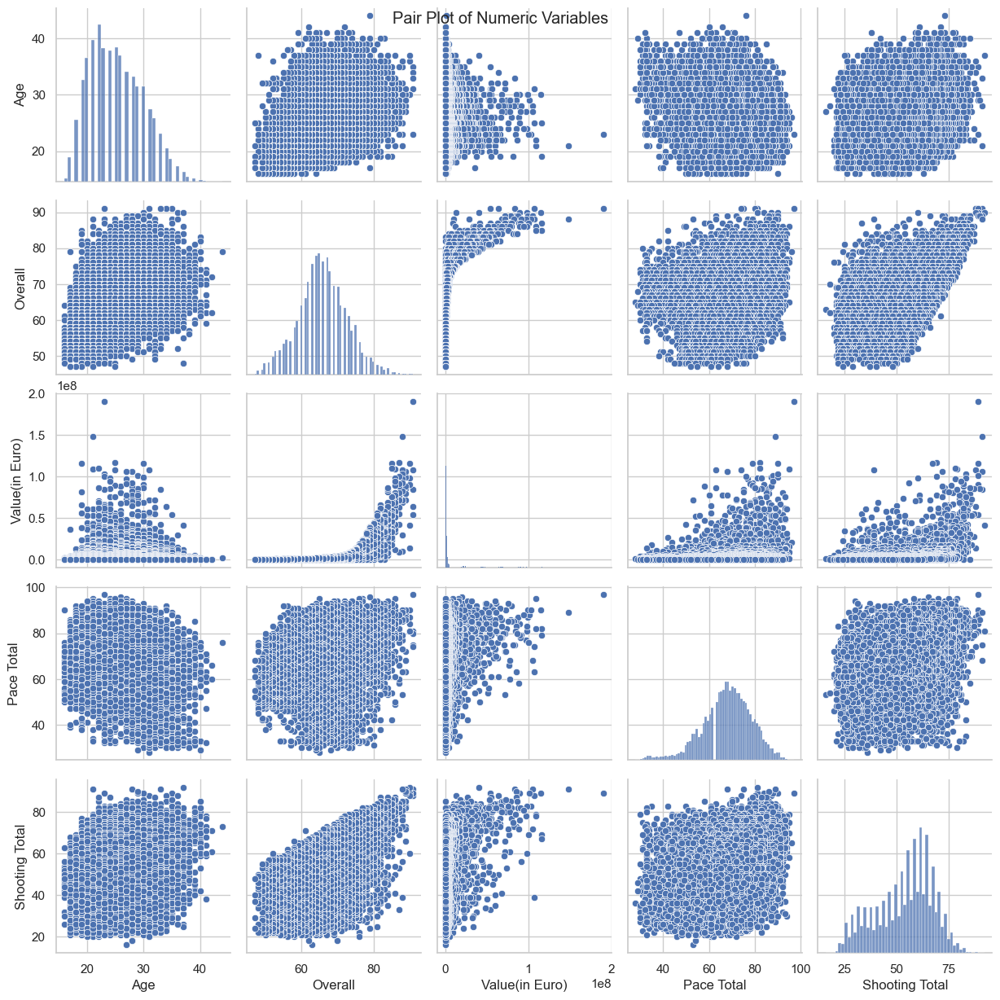

In [59]:
# Create a pair plot for 'Age', 'Overall', 'Value(in Euro)', 'Pace Total', 'Shooting Total'
sns.pairplot(data=fifa_data[['Age', 'Overall', 'Value(in Euro)', 'Pace Total', 'Shooting Total']])
plt.suptitle('Pair Plot of Numeric Variables')
plt.show()

Split between numerical and categorical 

In [126]:
fifa_data_copy = fifa_data.copy()

# List of columns to drop
columns_to_drop = ['Known As', 'Full Name', 'Image Link', 'National Team Image Link', 
                   'Positions Played', 'Best Position', 'Club Name', 'Club Position', 
                   'Contract Until', 'Joined On', 'On Loan', 'Preferred Foot', 
                   'Weak Foot Rating', 'Skill Moves', 'International Reputation', 
                   'National Team Name', 'National Team Position', 
                   'National Team Jersey Number', 'Attacking Work Rate', 
                   'Defensive Work Rate', 'ST Rating', 'LW Rating', 'LF Rating', 
                   'CF Rating', 'RF Rating', 'RW Rating', 'CAM Rating', 'LM Rating', 
                   'CM Rating', 'RM Rating', 'LWB Rating', 'CDM Rating', 'RWB Rating', 
                   'LB Rating', 'CB Rating', 'RB Rating', 'GK Rating']

# Additional columns to drop
#additional_columns_to_drop = ['Additional_Column1', 'Additional_Column2', 'Additional_Column3']

# Drop more columns from the copy
fifa_data_copy = fifa_data_copy.drop(columns=columns_to_drop, axis=1)

fifa_data_copy.head()

,Overall,Potential,Value(in Euro),Nationality,Age,Height(in cm),Weight(in kg),TotalStats,BaseStats,Wage(in Euro),Release Clause,Club Jersey Number,Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Dribbling,Curve,Freekick Accuracy,LongPassing,BallControl,Acceleration,Sprint Speed,Agility,Reactions,Balance,Shot Power,Jumping,Stamina,Strength,Long Shots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle,Goalkeeper Diving,Goalkeeper Handling,GoalkeeperKicking,Goalkeeper Positioning,Goalkeeper Reflexes
0,91,91,54000000,Argentina,35,169,67,2190,452,195000,99900000,30,81,89,90,94,34,64,84,90,70,91,88,95,93,93,90,93,87,76,91,92,95,86,68,70,68,91,44,40,93,94,75,96,20,35,24,6,11,15,14,8
1,91,91,64000000,France,34,185,81,2147,455,450000,131199999,9,80,88,83,87,39,78,75,92,90,89,88,87,82,73,76,91,79,80,78,92,72,87,79,82,82,80,63,39,92,89,84,90,43,24,18,13,11,5,5,7
2,91,91,84000000,Poland,33,185,81,2205,458,420000,172200000,9,75,91,79,86,44,83,71,94,91,84,89,85,79,85,70,89,76,75,77,93,82,91,85,76,87,84,81,49,94,81,90,88,35,42,19,15,6,12,8,10
3,91,91,107500000,Belgium,31,181,70,2303,483,350000,198900000,17,74,88,93,87,64,77,94,85,55,93,83,88,89,83,93,90,76,73,76,91,78,92,63,88,74,91,75,66,88,94,83,89,68,65,53,15,13,5,10,13
4,91,95,190500000,France,23,182,73,2177,470,230000,366700000,7,97,89,80,92,36,76,78,93,72,85,83,93,80,69,71,91,97,97,93,93,81,88,77,87,76,82,64,38,92,83,80,88,26,34,32,13,5,7,11,6


In [90]:
#Split between numerical and categorical data
#num = fifa_data_copy.select_dtypes(include = np.number)
#cat = fifa_data_copy.select_dtypes(include = 'object')

Check correlation

In [114]:
correlations_matrix = fifa_data_copy.corr(method="spearman")
correlations_matrix

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/500676854.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Overall,Potential,Value(in Euro),Age,Height(in cm),Weight(in kg),TotalStats,BaseStats,Wage(in Euro),Release Clause,Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Heading Accuracy,Short Passing,Volleys,Dribbling,Curve,Freekick Accuracy,LongPassing,BallControl,Acceleration,Sprint Speed,Agility,Reactions,Balance,Shot Power,Jumping,Stamina,Strength,Long Shots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle,Goalkeeper Diving,Goalkeeper Handling,GoalkeeperKicking,Goalkeeper Positioning,Goalkeeper Reflexes
Overall,1.000000,0.606298,0.853776,0.476825,0.026358,0.120196,0.671657,0.821849,0.739084,0.697311,0.281025,0.484901,0.682374,0.691000,0.398265,0.562253,0.459196,0.349477,0.414399,0.651776,0.362553,0.520994,0.441292,0.371453,0.540102,0.644815,0.196927,0.215562,0.261402,0.868144,0.146517,0.549464,0.299710,0.446227,0.356333,0.435966,0.431283,0.385745,0.446586,0.529255,0.333324,0.730323,0.368671,0.351713,0.320400,-0.001872,0.015591,0.014102,0.004840,0.004491
Potential,0.606298,1.000000,0.811508,-0.292047,0.012696,-0.014210,0.370123,0.469174,0.499291,0.673588,0.281805,0.274419,0.408347,0.492019,0.195007,0.189975,0.257921,0.227855,0.207822,0.446915,0.208817,0.405956,0.261086,0.187580,0.341170,0.464493,0.223120,0.226654,0.198584,0.499377,0.132333,0.311285,0.074154,0.183716,0.068878,0.238042,0.187899,0.192932,0.266509,0.332412,0.187948,0.411613,0.180346,0.208429,0.188137,-0.049059,-0.046195,-0.041615,-0.049466,-0.057247
Value(in Euro),0.853776,0.811508,1.000000,0.055262,-0.029952,0.008708,0.621040,0.703475,0.698167,0.814378,0.366590,0.400782,0.568619,0.646629,0.307928,0.390560,0.451409,0.387649,0.364738,0.637485,0.374452,0.578709,0.438196,0.359999,0.508931,0.662549,0.326438,0.337962,0.332963,0.724113,0.219998,0.500881,0.207711,0.425831,0.223299,0.429835,0.353523,0.323586,0.460301,0.501509,0.336943,0.630486,0.310192,0.320999,0.292488,-0.085867,-0.072591,-0.071720,-0.077628,-0.085168
Age,0.476825,-0.292047,0.055262,1.000000,0.069186,0.210993,0.326521,0.416333,0.294215,0.048617,-0.064776,0.275341,0.352123,0.243871,0.256973,0.467144,0.198721,0.113019,0.256295,0.236065,0.160893,0.098763,0.187055,0.200885,0.236368,0.191634,-0.116665,-0.099888,0.008870,0.459247,-0.036647,0.287469,0.273947,0.242043,0.365580,0.209466,0.295696,0.227767,0.176899,0.227549,0.165128,0.386204,0.220081,0.165055,0.151499,0.093507,0.112000,0.103838,0.100623,0.109306
Height(in cm),0.026358,0.012696,-0.029952,0.069186,1.000000,0.758794,-0.352228,-0.137355,0.046365,-0.039973,-0.384196,-0.063535,-0.185320,-0.274452,0.062593,0.403325,-0.481394,-0.348913,0.206460,-0.283692,-0.342510,-0.458542,-0.441932,-0.429115,-0.283374,-0.350621,-0.549432,-0.431851,-0.644356,0.006347,-0.781535,-0.190355,0.072746,-0.239338,0.525037,-0.366046,-0.007731,-0.053099,-0.386242,-0.367423,-0.317406,-0.148810,-0.042292,-0.051560,-0.064431,0.209968,0.205668,0.200592,0.192842,0.197890
Weight(in kg),0.120196,-0.014210,0.008708,0.210993,0.758794,1.000000,-0.234922,-0.031906,0.063267,0.007021,-0.328675,0.009818,-0.105463,-0.187160,0.085471,0.481727,-0.379421,-0.265594,0.234456,-0.202503,-0.256905,-0.368930,-0.350320,-0.328701,-0.215690,-0.264326,-0.478086,-0.377890,-0.547670,0.092919,-0.649229,-0.090998,0.143204,-0.164485,0.597219,-0.261753,0.060561,-0.017128,-0.289782,-0.286872,-0.224477,-0.061825,-0.006493,-0.022889,-0.037333,0.194595,0.187804,0.186981,0.183810,0.189127
TotalStats,0.671657,0.370123,0.621040,0.326521,-0.352228,-0.234922,1.000000,0.800157,0.531066,0.509118,0.348039,0.391613,0.651040,0.606632,0.422610,0.355939,0.812498,0.668627,0.443814,0.867993,0.709151,0.819195,0.829510,0.786006,0.813734,0.869275,0.523153,0.499983,0.634154,0.656340,0.545152,0.739581,0.296459,0.720281,0.196446,0.798706,0.599104,0.531888,0.770141,0.800283,0.648944,0.795417,0.510187,0.502233,0.475657,-0.257595,-0.240095,-0.241394,-0.249997,-0.252045
BaseStats,0.821849,0.469174,0.703475,0.416333,-0.137355,-0.031

In [115]:
correlations_matrix.columns

Index(['Overall', 'Potential', 'Value(in Euro)', 'Age', 'Height(in cm)',
       'Weight(in kg)', 'TotalStats', 'BaseStats', 'Wage(in Euro)',
       'Release Clause', 'Pace Total', 'Shooting Total', 'Passing Total',
       'Dribbling Total', 'Defending Total', 'Physicality Total', 'Crossing',
       'Finishing', 'Heading Accuracy', 'Short Passing', 'Volleys',
       'Dribbling', 'Curve', 'Freekick Accuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance',
       'Shot Power', 'Jumping', 'Stamina', 'Strength', 'Long Shots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'Standing Tackle', 'Sliding Tackle',
       'Goalkeeper Diving', 'Goalkeeper Handling', ' GoalkeeperKicking',
       'Goalkeeper Positioning', 'Goalkeeper Reflexes'],
      dtype='object')

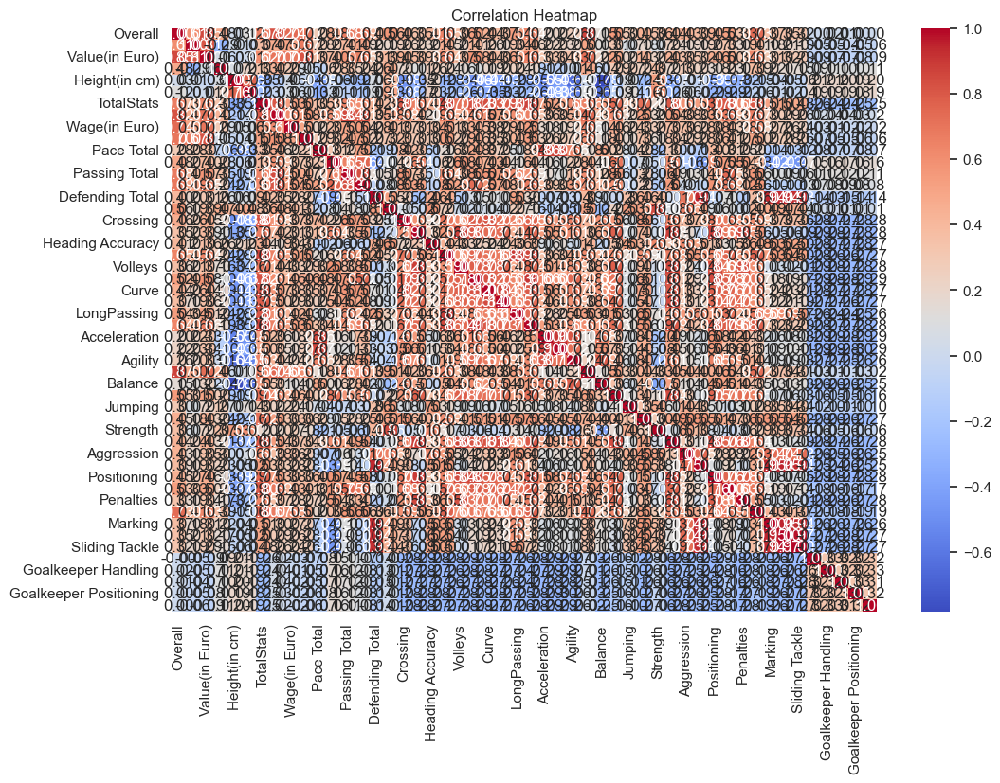

In [116]:
#Create the correlation heatmap 

plt.figure(figsize=(12, 8))
sns.heatmap(correlations_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()
 

In [94]:
#Still too much variables, let's try to drop further columns that are very highly correlated

Columns we can consider dropping for a correlation heatmap:

- 'Potential': While 'Potential' is related to a player's development, it may be highly correlated with 'Overall' and might not provide additional information.

- 'TotalStats' and 'BaseStats': These columns may be highly correlated with the individual skill attributes, so we might not need both.

- 'Release Clause': The release clause may not be a direct indicator of player attributes, so it might not be useful for correlation analysis.

- Goalkeeper-Related Columns: If we are focused on outfield players and not goalkeepers, you can drop the -goalkeeper-related attributes ('Goalkeeper Diving', 'Goalkeeper Handling', 'Goalkeeper Kicking', 'Goalkeeper Positioning', 'Goalkeeper Reflexes').

- 'Weight(in kg)' and 'Height(in cm)': These columns represent a player's weight and height, which may not strongly correlate with other attributes or market value.

In [128]:
# List of numerical columns to drop
numerical_columns_to_drop = [
    'Potential', 'TotalStats', 'BaseStats', 'Release Clause',
    'Goalkeeper Diving', 'Goalkeeper Handling', 'Goalkeeper Positioning', 'Goalkeeper Reflexes',
    'Heading Accuracy', 'Long Shots', 'Club Jersey Number', ]

# Drop the specified numerical columns from the copy of the dataset
fifa_data_copy = fifa_data_copy.drop(columns=numerical_columns_to_drop, axis=1)
fifa_data_copy.head()

,Overall,Value(in Euro),Nationality,Age,Height(in cm),Weight(in kg),Wage(in Euro),Club Jersey Number,Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Short Passing,Volleys,Dribbling,Curve,Freekick Accuracy,LongPassing,BallControl,Acceleration,Sprint Speed,Agility,Reactions,Balance,Shot Power,Jumping,Stamina,Strength,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle,GoalkeeperKicking
0,91,54000000,Argentina,35,169,67,195000,30,81,89,90,94,34,64,84,90,91,88,95,93,93,90,93,87,76,91,92,95,86,68,70,68,44,40,93,94,75,96,20,35,24,15
1,91,64000000,France,34,185,81,450000,9,80,88,83,87,39,78,75,92,89,88,87,82,73,76,91,79,80,78,92,72,87,79,82,82,63,39,92,89,84,90,43,24,18,5
2,91,84000000,Poland,33,185,81,420000,9,75,91,79,86,44,83,71,94,84,89,85,79,85,70,89,76,75,77,93,82,91,85,76,87,81,49,94,81,90,88,35,42,19,12
3,91,107500000,Belgium,31,181,70,350000,17,74,88,93,87,64,77,94,85,93,83,88,89,83,93,90,76,73,76,91,78,92,63,88,74,75,66,88,94,83,89,68,65,53,5
4,91,190500000,France,23,182,73,230000,7,97,89,80,92,36,76,78,93,85,83,93,80,69,71,91,97,97,93,93,81,88,77,87,76,64,38,92,83,80,88,26,34,32,7


In [123]:
correlations_matrix_2 = fifa_data_copy.corr(method="spearman")
correlations_matrix_2

correlations_matrix_2.columns

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/3214827092.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Index(['Overall', 'Value(in Euro)', 'Age', 'Height(in cm)', 'Weight(in kg)',
       'Wage(in Euro)', 'Pace Total', 'Shooting Total', 'Passing Total',
       'Dribbling Total', 'Defending Total', 'Physicality Total', 'Crossing',
       'Finishing', 'Heading Accuracy', 'Short Passing', 'Volleys',
       'Dribbling', 'Curve', 'Freekick Accuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance',
       'Shot Power', 'Jumping', 'Stamina', 'Strength', 'Long Shots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'Standing Tackle', 'Sliding Tackle',
       ' GoalkeeperKicking'],
      dtype='object')

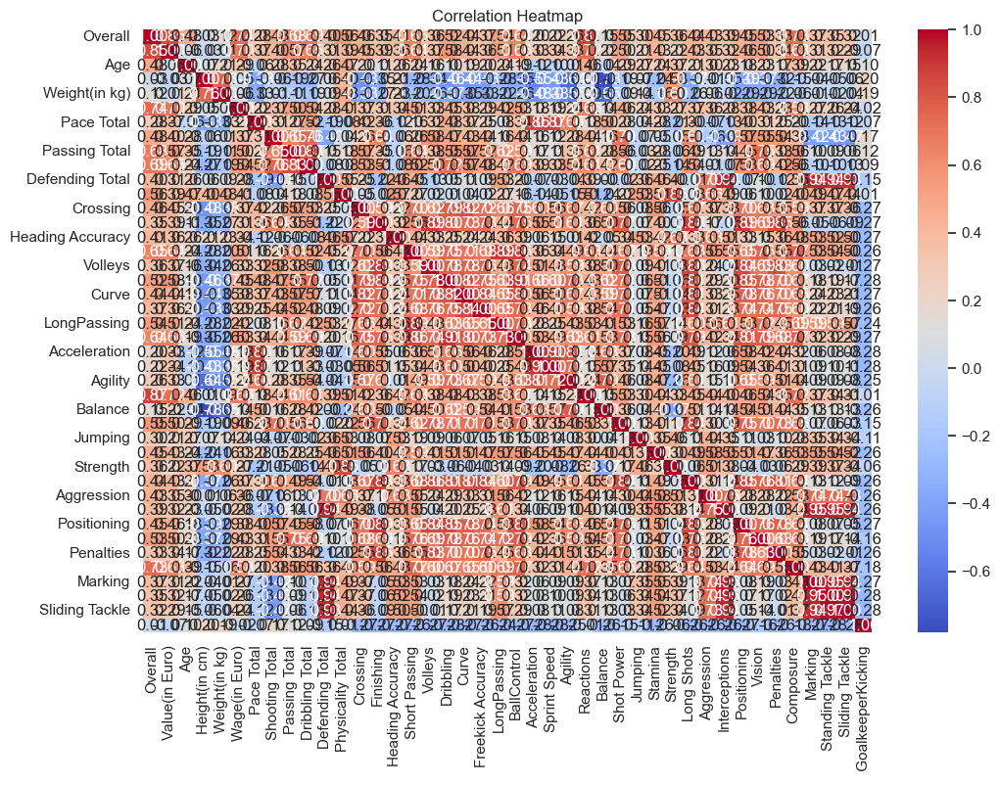

In [124]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlations_matrix_2, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [131]:
#Third test with other variables

columns_to_keep = [
    'Overall', 'Value(in Euro)', 'Age', 'Height(in cm)', 'Weight(in kg)',
    'Wage(in Euro)', 'Pace Total', 'Shooting Total', 'Passing Total',
    'Dribbling Total', 'Defending Total', 'Physicality Total',
    'Crossing', 'Finishing', 'Reactions', 'Shot Power',
    'Acceleration', 'Sprint Speed', 'Agility',
    'Balance', 'Positioning', 'Vision', 'Penalties', 'Composure',
    'Marking', 'Standing Tackle', 'Sliding Tackle'
]

# Create a new DataFrame by selecting only the columns to keep
fifa_data_filtered = fifa_data_copy[columns_to_keep]

In [132]:
correlations_matrix_3 = fifa_data_filtered.corr(method="spearman")
correlations_matrix_3

,Overall,Value(in Euro),Age,Height(in cm),Weight(in kg),Wage(in Euro),Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Reactions,Shot Power,Acceleration,Sprint Speed,Agility,Balance,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle
Overall,1.000000,0.853776,0.476825,0.026358,0.120196,0.739084,0.281025,0.484901,0.682374,0.691000,0.398265,0.562253,0.459196,0.349477,0.868144,0.549464,0.196927,0.215562,0.261402,0.146517,0.446586,0.529255,0.333324,0.730323,0.368671,0.351713,0.320400
Value(in Euro),0.853776,1.000000,0.055262,-0.029952,0.008708,0.698167,0.366590,0.400782,0.568619,0.646629,0.307928,0.390560,0.451409,0.387649,0.724113,0.500881,0.326438,0.337962,0.332963,0.219998,0.460301,0.501509,0.336943,0.630486,0.310192,0.320999,0.292488
Age,0.476825,0.055262,1.000000,0.069186,0.210993,0.294215,-0.064776,0.275341,0.352123,0.243871,0.256973,0.467144,0.198721,0.113019,0.459247,0.287469,-0.116665,-0.099888,0.008870,-0.036647,0.176899,0.227549,0.165128,0.386204,0.220081,0.165055,0.151499
Height(in cm),0.026358,-0.029952,0.069186,1.000000,0.758794,0.046365,-0.384196,-0.063535,-0.185320,-0.274452,0.062593,0.403325,-0.481394,-0.348913,0.006347,-0.190355,-0.549432,-0.431851,-0.644356,-0.781535,-0.386242,-0.367423,-0.317406,-0.148810,-0.042292,-0.051560,-0.064431
Weight(in kg),0.120196,0.008708,0.210993,0.758794,1.000000,0.063267,-0.328675,0.009818,-0.105463,-0.187160,0.085471,0.481727,-0.379421,-0.265594,0.092919,-0.090998,-0.478086,-0.377890,-0.547670,-0.649229,-0.289782,-0.286872,-0.224477,-0.061825,-0.006493,-0.022889,-0.037333
Wage(in Euro),0.739084,0.698167,0.294215,0.046365,0.063267,1.000000,0.220779,0.372615,0.502317,0.538956,0.281272,0.414778,0.371151,0.308863,0.658522,0.463578,0.181615,0.190748,0.235711,0.136548,0.379773,0.428287,0.282382,0.584923,0.270614,0.262277,0.237795
Pace Total,0.281025,0.366590,-0.064776,-0.384196,-0.328675,0.220779,1.000000,0.312640,0.274165,0.518097,-0.188432,-0.078834,0.422015,0.362988,0.180316,0.282871,0.856998,0.867176,0.655438,0.496360,0.397448,0.306037,0.248870,0.198010,-0.139735,-0.133975,-0.123809
Shooting Total,0.484901,0.400782,0.275341,-0.063535,0.009818,0.372615,0.312640,1.000000,0.646367,0.755051,-0.401177,0.044716,0.258265,0.641452,0.439859,0.699974,0.160820,0.123191,0.276447,0.162544,0.566121,0.546929,0.537616,0.382608,-0.415557,-0.433095,-0.467158
Passing Total,0.682374,0.568619,0.352123,-0.185320,-0.105463,0.502317,0.274165,0.646367,1.000000,0.829205,0.152319,0.178222,0.571179,0.346544,0.614550,0.558926,0.170649,0.112920,0.351153,0.281734,0.453256,0.745580,0.325115,0.564591,0.097672,0.085297,0.058843
Dribbling Total,0.691000,0.646629,0.243871,-0.274452,-0.187160,0.538956,0.518097,0.755051,0.829205,1.000000,-0.082282,0.077372,0.525082,0.508692,0.607375,0.602793,0.393175,0.325337,0.538432,0.421424,0.580131,0.686754,0.418689,0.559700,-0.097808,-0.104670,-0.128181


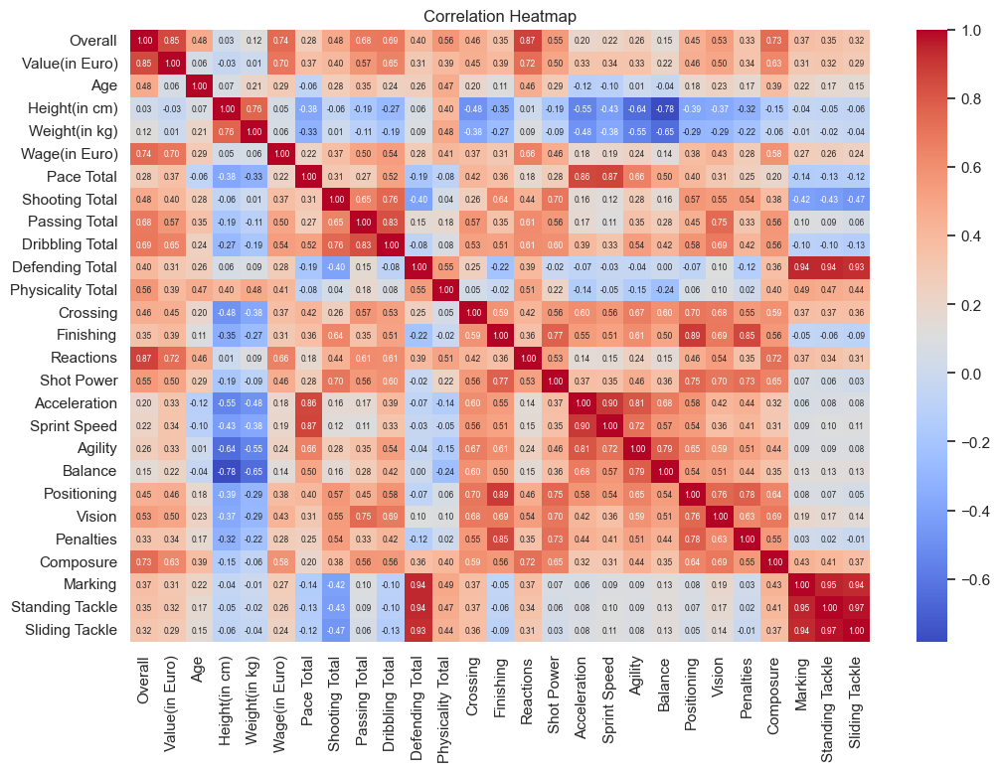

In [136]:
plt.figure(figsize=(12, 8))
sns.heatmap(correlations_matrix_3, annot=True, cmap="coolwarm", fmt=".2f", annot_kws={"size": 6})
plt.title("Correlation Heatmap")
plt.show()

In [140]:
# Create an empty dictionary to store correlation coefficients
correlation_coefficients = {}

# Iterate through the columns in the correlation matrix
for column1 in correlations_matrix_3.columns:
    for column2 in correlations_matrix_3.columns:
        if column1 != column2:  # Avoid computing the correlation of a column with itself
            correlation_coefficient = correlations_matrix_3.loc[column1, column2]
            correlation_coefficients[f'{column1} vs {column2}'] = correlation_coefficient

# 'correlation_coefficients' now contains correlation coefficients for all pairs of columns


# Display the correlation coefficients vertically
for key, value in correlation_coefficients.items():
    print(f'{key}: {value}')

Overall vs Value(in Euro): 0.8537762765857635
Overall vs Age: 0.47682523427452217
Overall vs Height(in cm): 0.026357533186345244
Overall vs Weight(in kg): 0.12019628137814067
Overall vs Wage(in Euro): 0.739084478511872
Overall vs Pace Total: 0.28102479862783725
Overall vs Shooting Total: 0.4849012006991281
Overall vs Passing Total: 0.682374039751376
Overall vs Dribbling Total: 0.690999751268218
Overall vs Defending Total: 0.3982645395523189
Overall vs Physicality Total: 0.5622526329439194
Overall vs Crossing: 0.45919568662067073
Overall vs Finishing: 0.34947679604117515
Overall vs Reactions: 0.8681440892583789
Overall vs Shot Power: 0.549464444439214
Overall vs Acceleration: 0.19692726215964268
Overall vs Sprint Speed: 0.21556228242344794
Overall vs Agility: 0.26140220273733444
Overall vs Balance: 0.14651712725234523
Overall vs Positioning: 0.44658626557600356
Overall vs Vision: 0.5292550656481979
Overall vs Penalties: 0.33332360641274744
Overall vs Composure: 0.7303227783137564
Overal

# Preprocessing Data - Normalization

In [147]:
#Normalization
#This scaling process is beneficial in situations where you want to make sure 
#that features with different scales or units do not dominate the learning process.

from sklearn.preprocessing import MinMaxScaler

numerical_scal = MinMaxScaler().fit(fifa_data_filtered) 
numerical_minmax = numerical_scal.transform(fifa_data_filtered) 
numerical_minmax

array([[1.00000000e+00, 2.83464567e-01, 6.78571429e-01, ...,
        1.91011236e-01, 3.33333333e-01, 2.14285714e-01],
       [1.00000000e+00, 3.35958005e-01, 6.42857143e-01, ...,
        4.49438202e-01, 2.06896552e-01, 1.42857143e-01],
       [1.00000000e+00, 4.40944882e-01, 6.07142857e-01, ...,
        3.59550562e-01, 4.13793103e-01, 1.54761905e-01],
       ...,
       [0.00000000e+00, 6.82414698e-04, 7.14285714e-02, ...,
        4.04494382e-01, 3.56321839e-01, 5.00000000e-01],
       [0.00000000e+00, 5.24934383e-04, 3.57142857e-02, ...,
        5.28089888e-01, 5.51724138e-01, 5.71428571e-01],
       [0.00000000e+00, 3.14960630e-04, 3.21428571e-01, ...,
        4.94382022e-01, 4.36781609e-01, 4.40476190e-01]])

In [148]:
numerical_scaled = pd.DataFrame(numerical_minmax,columns=fifa_data_filtered.columns)
numerical_scaled.head() 

,Overall,Value(in Euro),Age,Height(in cm),Weight(in kg),Wage(in Euro),Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Reactions,Shot Power,Acceleration,Sprint Speed,Agility,Balance,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle
0,1.0,0.283465,0.678571,0.274510,0.321429,0.433333,0.768116,0.960526,0.955882,1.000000,0.250000,0.557377,0.886364,0.956044,0.968750,0.894737,0.879518,0.743902,0.960526,1.000000,0.968085,1.000000,0.802326,1.000000,0.191011,0.333333,0.214286
1,1.0,0.335958,0.642857,0.588235,0.571429,1.000000,0.753623,0.947368,0.852941,0.893939,0.315789,0.786885,0.784091,0.978022,0.968750,0.907895,0.783133,0.792683,0.789474,0.693333,0.957447,0.940476,0.906977,0.927711,0.449438,0.206897,0.142857
2,1.0,0.440945,0.607143,0.588235,0.571429,0.933333,0.681159,0.986842,0.794118,0.878788,0.381579,0.868852,0.738636,1.000000,0.984375,0.960526,0.746988,0.731707,0.776316,0.826667,0.978723,0.845238,0.976744,0.903614,0.359551,0.413793,0.154762
3,1.0,0.564304,0.535714,0.509804,0.375000,0.777778,0.666667,0.947368,1.000000,0.893939,0.644737,0.770492,1.000000,0.901099,0.953125,0.973684,0.746988,0.707317,0.763158,0.773333,0.914894,1.000000,0.895349,0.915663,0.730337,0.678161,0.559524
4,1.0,1.000000,0.250000,0.529412,0.428571,0.511111,1.000000,0.960526,0.808824,0.969697,0.276316,0.754098,0.818182,0.989011,0.984375,0.921053,1.000000,1.000000,0.986842,0.813333,0.957447,0.869048,0.860465,0.903614,0.258427,0.321839,0.309524


In [149]:
numerical_scaled.describe()

,Overall,Value(in Euro),Age,Height(in cm),Weight(in kg),Wage(in Euro),Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Reactions,Shot Power,Acceleration,Sprint Speed,Agility,Balance,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle
count,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000,18539.000000
mean,0.428455,0.015094,0.330015,0.520605,0.467391,0.019610,0.579967,0.497077,0.485652,0.531963,0.463702,0.570088,0.494055,0.475333,0.492853,0.524048,0.611149,0.607785,0.598933,0.587461,0.516174,0.526090,0.488307,0.542610,0.491545,0.487347,0.479335
std,0.154281,0.040079,0.168506,0.134472,0.125243,0.043246,0.154341,0.179209,0.142911,0.141463,0.215691,0.157012,0.203266,0.215647,0.139067,0.170393,0.184107,0.184247,0.196123,0.193109,0.209149,0.160452,0.182907,0.145015,0.228654,0.243582,0.246442
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.340909,0.002493,0.178571,0.431373,0.375000,0.002222,0.492754,0.368421,0.397059,0.454545,0.276316,0.459016,0.375000,0.307692,0.406250,0.394737,0.518072,0.512195,0.486842,0.480000,0.404255,0.416667,0.383721,0.457831,0.292135,0.252874,0.238095
50%,0.431818,0.005249,0.321429,0.529412,0.464286,0.006667,0.594203,0.526316,0.500000,0.545455,0.513158,0.590164,0.545455,0.516484,0.500000,0.539474,0.650602,0.646341,0.631579,0.613333,0.574468,0.547619,0.500000,0.554217,0.561798,0.574713,0.559524
75%,0.522727,0.010499,0.464286,0.607843,0.553571,0.017778,0.681159,0.631579,0.588235,0.621212,0.644737,0.688525,0.647727,0.648352,0.578125,0.657895,0.734940,0.731707,0.736842,0.720000,0.659574,0.642857,0.627907,0.638554,0.674157,0.689655,0.678571
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




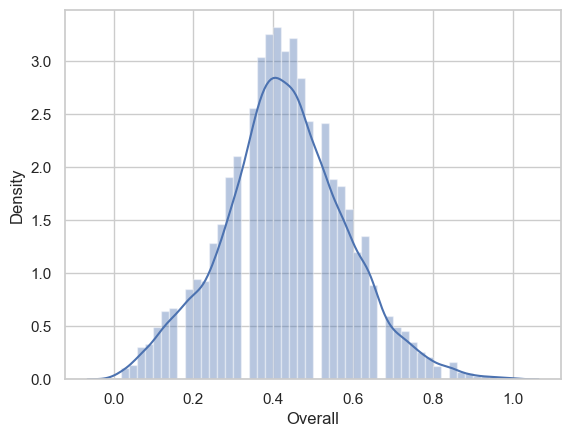

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




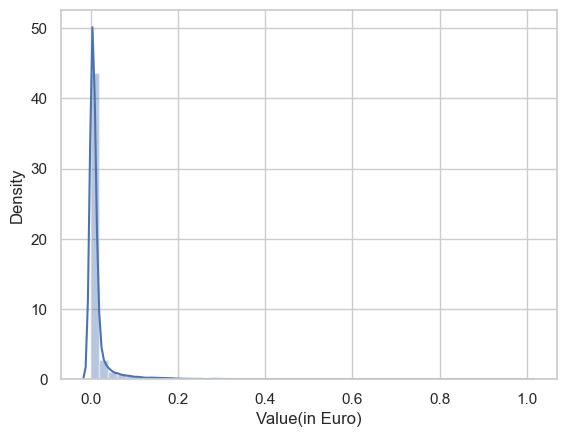

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




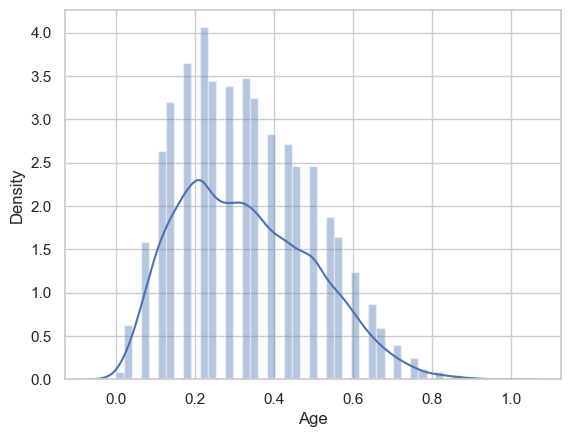

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




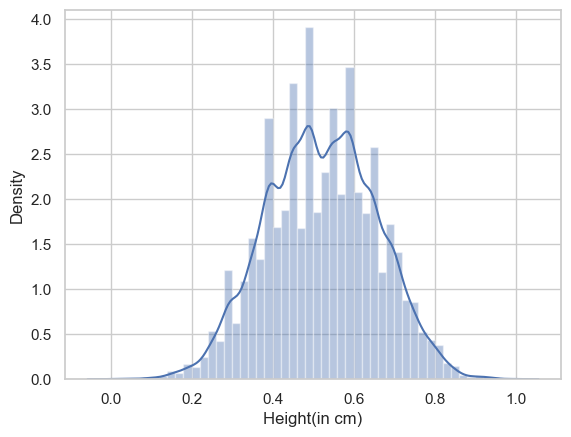

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




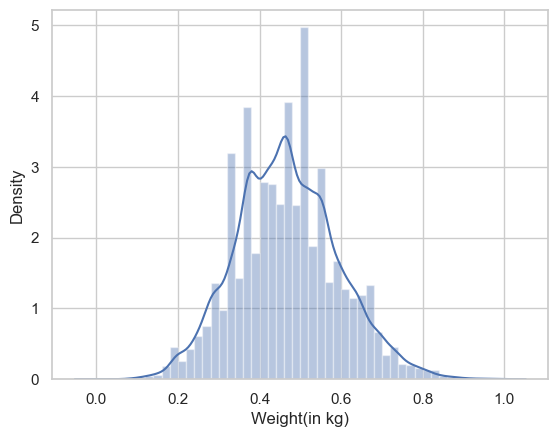

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




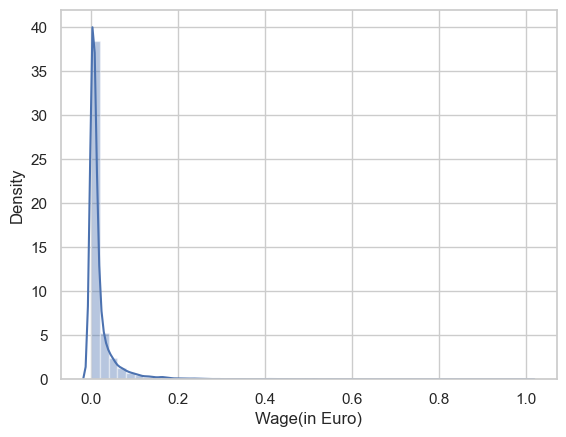

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




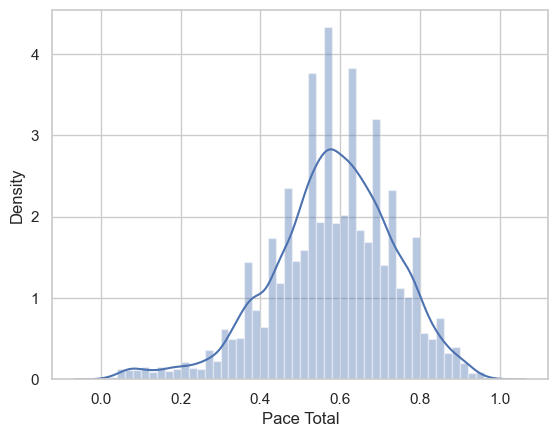

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




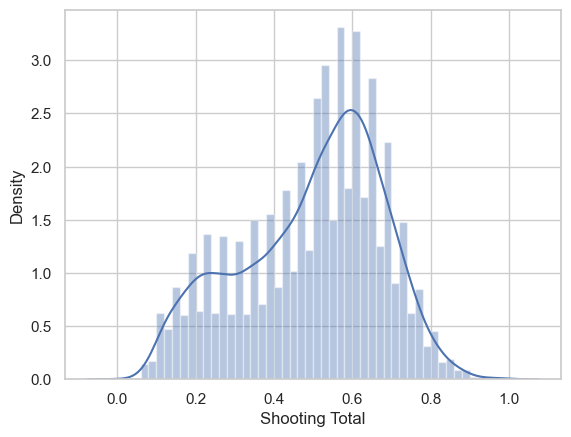

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




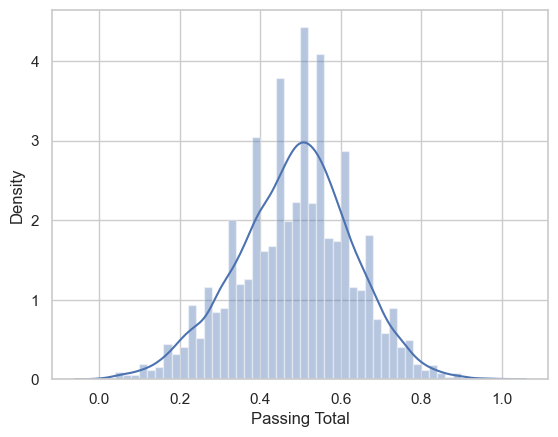

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




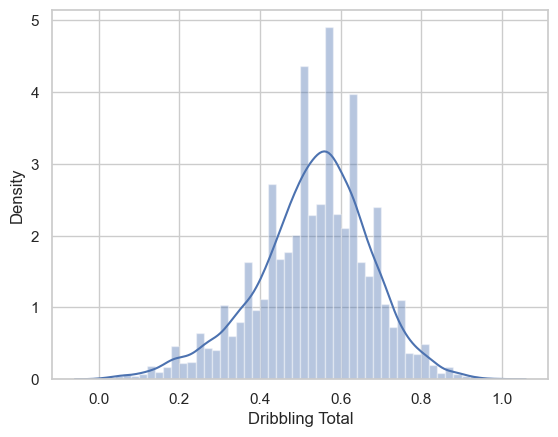

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




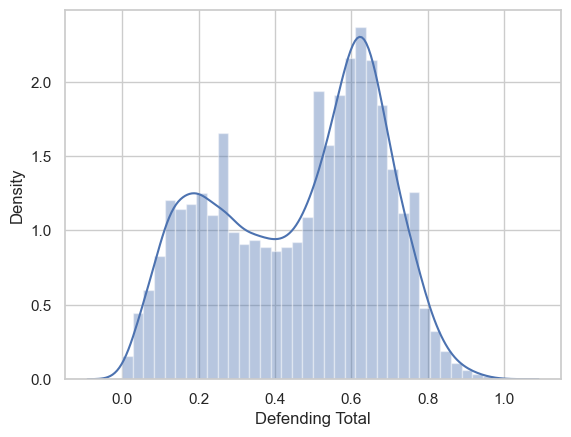

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




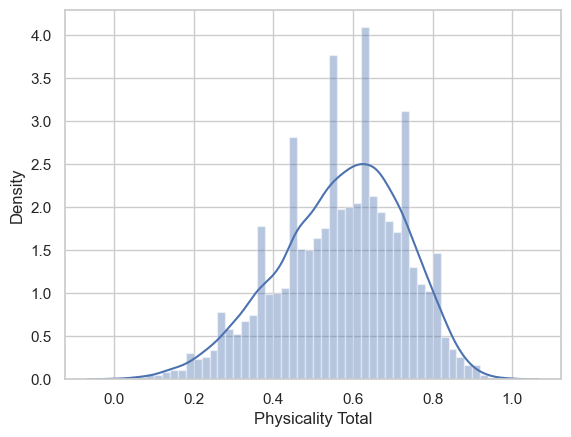

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




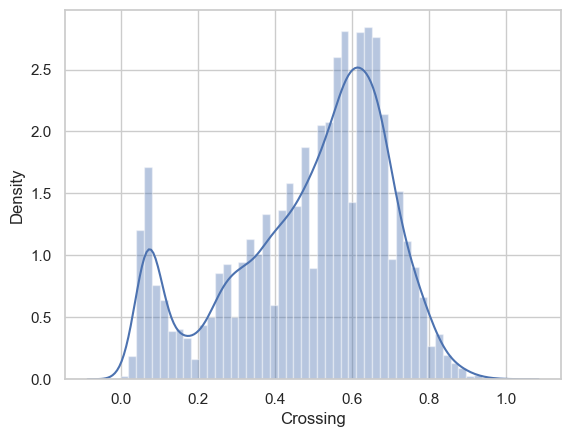

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




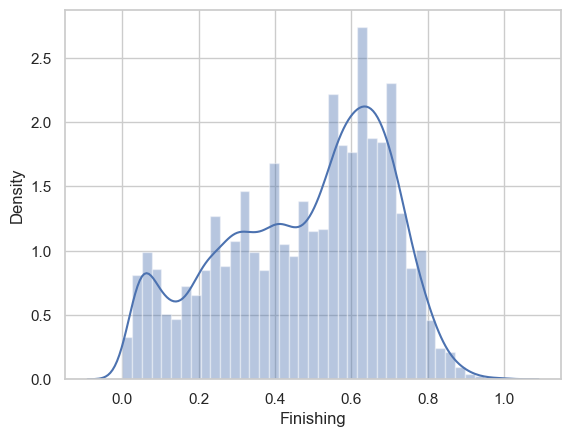

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




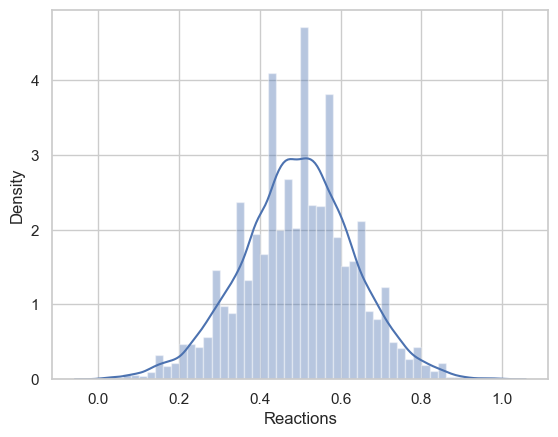

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




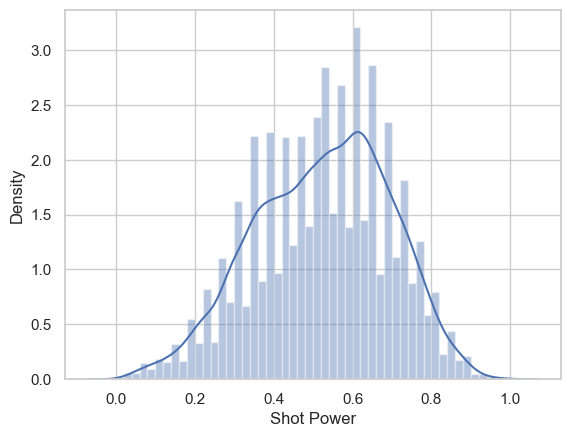

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




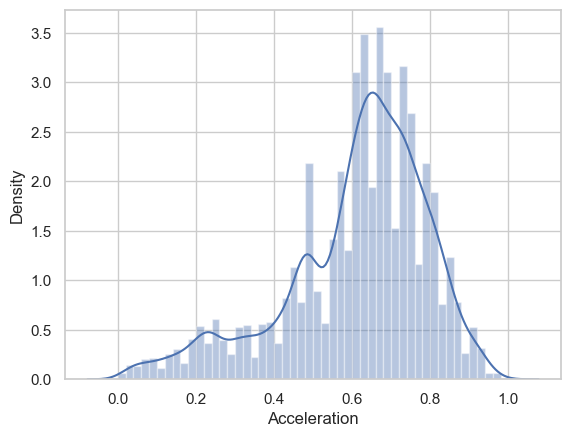

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




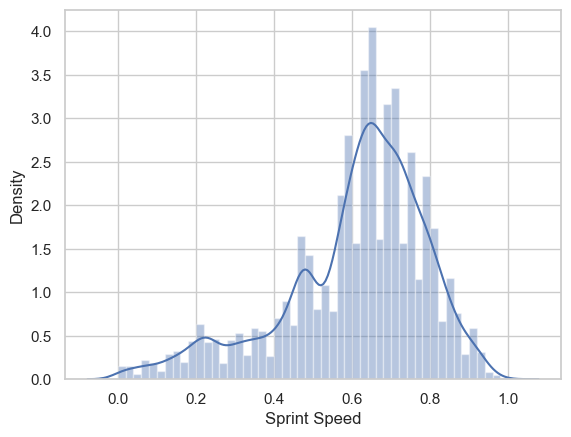

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




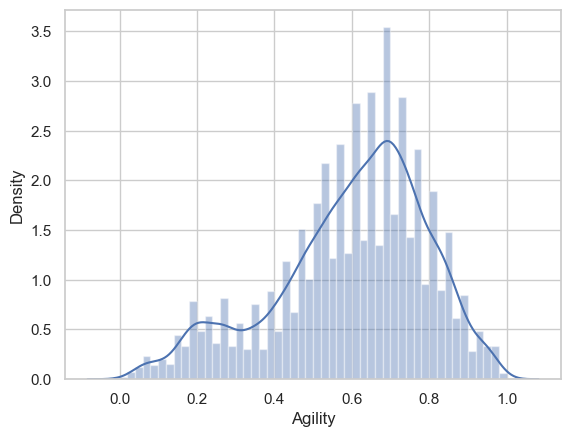

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




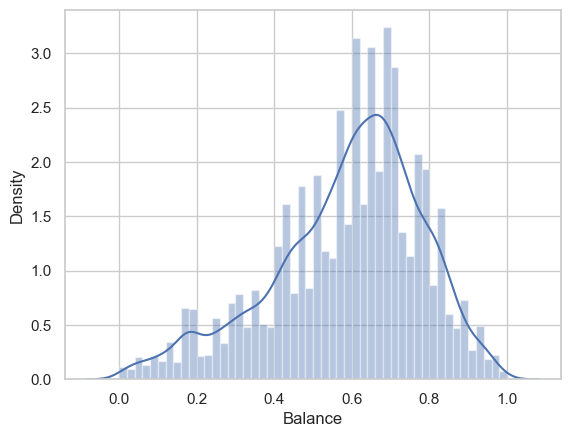

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




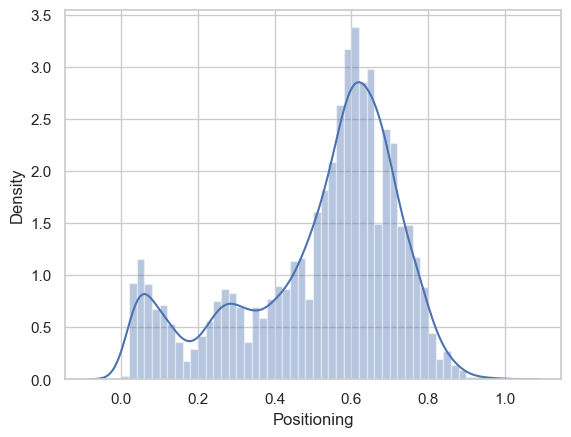

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




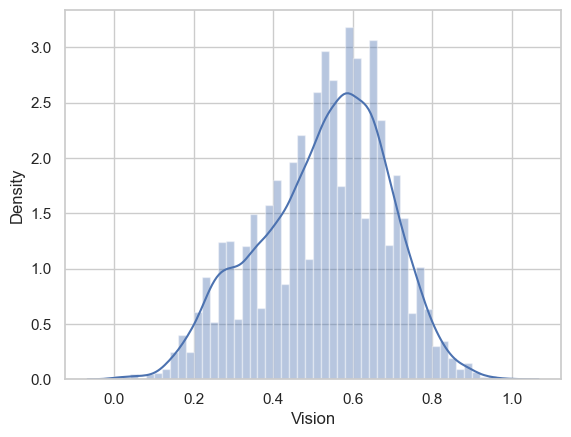

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




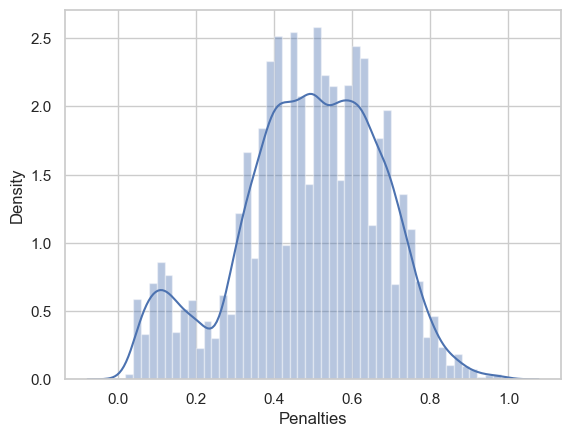

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




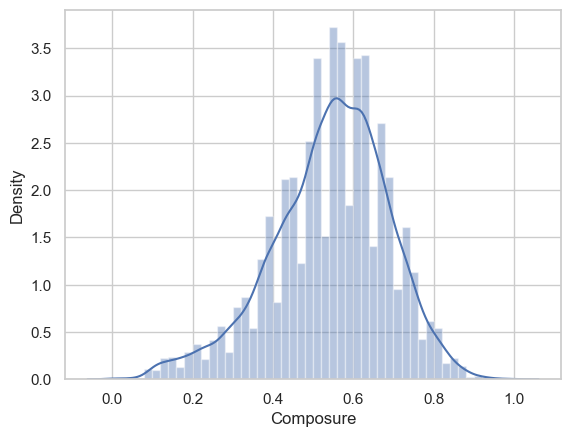

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




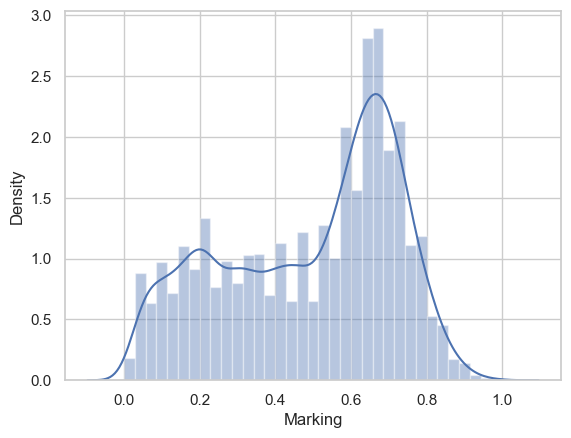

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




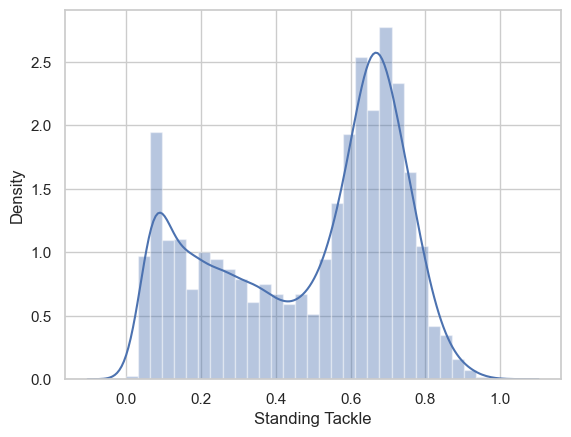

/var/folders/k_/zzt_gt2j0mgf2704mzjrzkcr0000gn/T/ipykernel_68820/2001298793.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




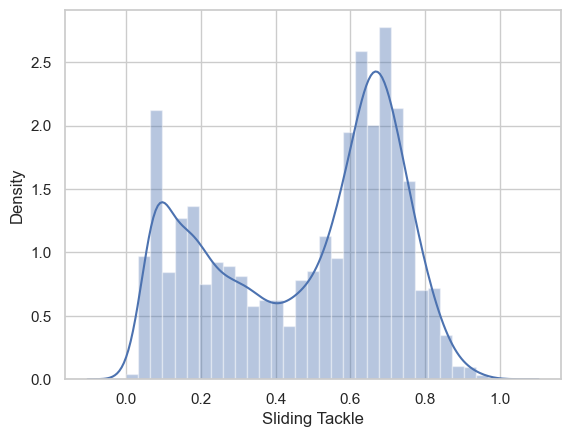

In [150]:
#Display the charts

#histograms with kernel density estimation" or "KDE histograms." 
#These plots combine a histogram, which shows the distribution of data as bars, 
#with a smoothed line representing the estimated probability density function (PDF) using kernel density estimation.



for column in numerical_scaled.columns:
    sns.distplot(numerical_scaled[column])
    plt.show()

In [151]:
#Box-Cox method

#The Box-Cox transformation is a data transformation technique that is used to stabilize variance ``
#and make data more closely follow a normal distribution. It is particularly useful when you're working 
#with data that exhibits heteroscedasticity (varying levels of variance across the data) and non-normality. 

from scipy import stats

epsilon = 1e-8  # Small constant to add to data with zero or negative values

numerical_boxcox = numerical_scaled.copy()  # Create a copy of the DataFrame
for column in numerical_scaled.columns:
    # Apply Box-Cox transformation with lambda=0 to log-transform data with lambda=0
    numerical_boxcox[column] = stats.boxcox(numerical_scaled[column] + epsilon, lmbda=0)


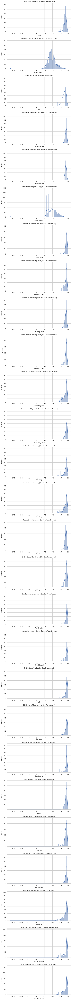

In [154]:
#display the box-cox results

# Set the style of the plot
sns.set(style="whitegrid")

# Create a figure with subplots
num_cols = len(numerical_boxcox.columns)
fig, axes = plt.subplots(nrows=num_cols, ncols=1, figsize=(8, 4 * num_cols))

# Iterate through each column and plot its distribution
for i, column in enumerate(numerical_boxcox.columns):
    sns.histplot(numerical_boxcox[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column} (Box-Cox Transformed)')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Density')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

Select the final dataset to perform linear regression model

In [155]:
final_data_fifa = pd.concat([fifa_data_filtered],axis=1)
final_data_fifa.head()

,Overall,Value(in Euro),Age,Height(in cm),Weight(in kg),Wage(in Euro),Pace Total,Shooting Total,Passing Total,Dribbling Total,Defending Total,Physicality Total,Crossing,Finishing,Reactions,Shot Power,Acceleration,Sprint Speed,Agility,Balance,Positioning,Vision,Penalties,Composure,Marking,Standing Tackle,Sliding Tackle
0,91,54000000,35,169,67,195000,81,89,90,94,34,64,84,90,92,86,87,76,91,95,93,94,75,96,20,35,24
1,91,64000000,34,185,81,450000,80,88,83,87,39,78,75,92,92,87,79,80,78,72,92,89,84,90,43,24,18
2,91,84000000,33,185,81,420000,75,91,79,86,44,83,71,94,93,91,76,75,77,82,94,81,90,88,35,42,19
3,91,107500000,31,181,70,350000,74,88,93,87,64,77,94,85,91,92,76,73,76,78,88,94,83,89,68,65,53
4,91,190500000,23,182,73,230000,97,89,80,92,36,76,78,93,93,88,97,97,93,81,92,83,80,88,26,34,32


In [157]:
#Choose the features and target

y = final_data_fifa["Value(in Euro)"]
x = final_data_fifa.drop(["Value(in Euro)"], axis=1)

In [164]:
#Import packages

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42) #70% rows training, 30% testing

# Before transforming and preprocessing data
model = LinearRegression()
model.fit(X_train,y_train)
predictions = model.predict(X_test)

In [165]:
#Determine model fiability
r2 = r2_score(y_test, predictions)

#r2_adjusted
RMSE = mean_squared_error(y_test, predictions, squared=False)
MSE = mean_squared_error(y_test, predictions)
MAE = mean_absolute_error(y_test, predictions)
print("r2 = ", r2) #Score between 0.7 and 1 = good model

print("RMSE = ", RMSE)
print("MSE = ", MSE)
print("MAE = ", MAE)

r2 =  0.711937206861919
RMSE =  4165017.159010711
MSE =  17347367934853.656
MAE =  1837034.9646050702


In [166]:
y.describe()

count    1.853900e+04
mean     2.875461e+06
std      7.635129e+06
min      0.000000e+00
25%      4.750000e+05
50%      1.000000e+06
75%      2.000000e+06
max      1.905000e+08
Name: Value(in Euro), dtype: float64

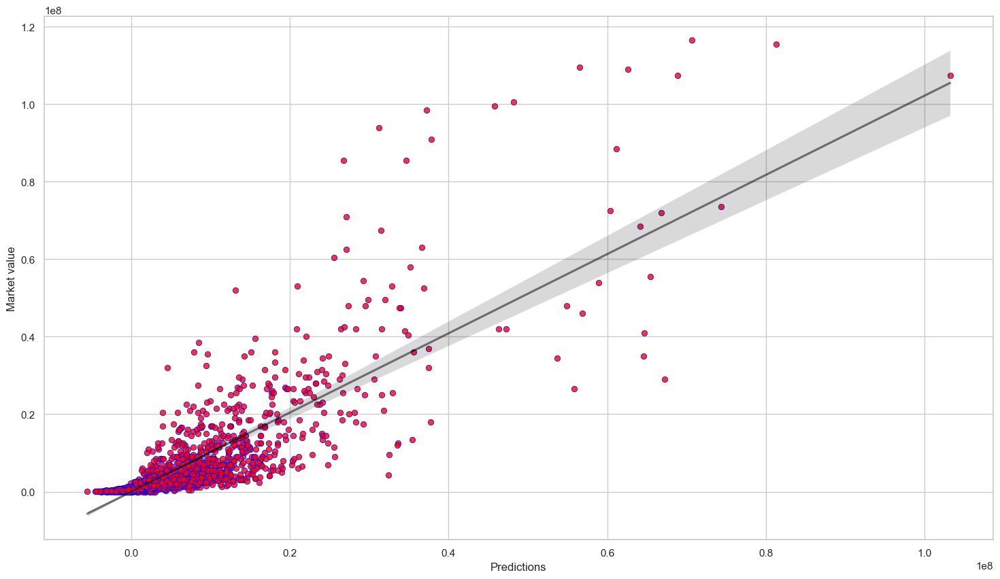

In [168]:
plt.figure(figsize=(18, 10))
sns.regplot(x=predictions, y=y_test, scatter_kws={'color':'red', 'edgecolor':'blue', 'linewidth':0.7}, line_kws={'color':'black', 'alpha':0.5})
plt.xlabel('Predictions')
plt.ylabel('Market value')
plt.show()


In [ ]:
#Let's try to improve the R2 score and the model 

In [170]:
#Choose the features and target

y = final_data_fifa["Value(in Euro)"]
x = final_data_fifa.drop(["Value(in Euro)", "Height(in cm)", "Weight(in kg)", "Finishing", "Reactions",
                          "Shot Power", "Acceleration", "Sprint Speed", "Agility", "Balance", "Positioning",
                          "Vision", "Penalties", "Composure", "Marking", "Standing Tackle", "Sliding Tackle"], 
                          axis=1)

In [171]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42) #70% rows training, 30% testing

# Before transforming and preprocessing data
model = LinearRegression()
model.fit(X_train,y_train)
predictions = model.predict(X_test)

In [172]:
#Determine model fiability
r2 = r2_score(y_test, predictions)

#r2_adjusted
RMSE = mean_squared_error(y_test, predictions, squared=False)
MSE = mean_squared_error(y_test, predictions)
MAE = mean_absolute_error(y_test, predictions)
print("r2 = ", r2) #Score between 0.7 and 1 = good model

print("RMSE = ", RMSE)
print("MSE = ", MSE)
print("MAE = ", MAE)

r2 =  0.7106034259471008
RMSE =  4174648.40081497
MSE =  17427689270426.986
MAE =  1812993.9416303698


In [ ]:
#Let's try to delete more columns to see if it's improving R2 score

In [173]:
#Choose the features and target

y = final_data_fifa["Value(in Euro)"]
x = final_data_fifa.drop(["Value(in Euro)", "Height(in cm)", "Weight(in kg)", "Finishing", "Reactions",
                          "Shot Power", "Acceleration", "Sprint Speed", "Agility", "Balance", "Crossing",
                          "Positioning",
                          "Vision", "Penalties", "Composure", "Marking", "Standing Tackle", "Sliding Tackle", 
                          "Wage(in Euro)", ], axis = 1)

In [174]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42) #70% rows training, 30% testing

# Before transforming and preprocessing data
model = LinearRegression()
model.fit(X_train,y_train)
predictions = model.predict(X_test)

In [175]:
#Determine model fiability
r2 = r2_score(y_test, predictions)

#r2_adjusted
RMSE = mean_squared_error(y_test, predictions, squared=False)
MSE = mean_squared_error(y_test, predictions)
MAE = mean_absolute_error(y_test, predictions)
print("r2 = ", r2) #Score between 0.7 and 1 = good model

print("RMSE = ", RMSE)
print("MSE = ", MSE)
print("MAE = ", MAE)

#Model seems to perform worse here

r2 =  0.367765592755087
RMSE =  6170385.173741141
MSE =  38073653192324.49
MAE =  3082051.422712765


In [1]:
#Code provided by Jesus 

# set figure size
plt.figure(figsize=(16, 8))

# loop through columns and create distribution plot for each
for i, col in enumerate(num):
    plt.subplot(2, 4, i+1)
    sns.histplot(num[col])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.title('Distribution of ' + col)
    
plt.tight_layout()
plt.show()

# calculate summary statistics for each column
summary_stats = pd.DataFrame({'mean': num.mean(),
                              'median': num.median(),
                              'min': num.min(),
                              'max': num.max(),
                              'std': num.std(),
                              'skewness': num.skew()})

# display summary statistics
print(summary_stats)